In [11]:
import sys
sys.path.insert(0, '..')

from ComputeC import computeC
from Process_gene_data import process_gene_data
import numpy as np
import json
import matplotlib.pyplot as plt
from brokenaxes import brokenaxes
from matplotlib.ticker import FixedLocator
from matplotlib.lines import Line2D
from matplotlib.colors import BoundaryNorm, ListedColormap
import sympy as sp
from sympy import Symbol, log
from sklearn.linear_model import LinearRegression
from scipy.special import comb

In [2]:
# Simulated data
arrays = [
    [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    [1, 2, 3, 4, 5, 6],
    [4, 5, 6, 7, 8, 9, 10],
    [4, 5, 6]
]
exon = 200
readlengh = 300
gene_dict = {1:200,2:200, 3:200, 4:200, 5:200, 6:200, 7:200, 8:200, 9:200, 10:200}

In [3]:
# Simulated data for rank-deficient sampling
wgauss = np.array([[0],[0],[0],[0],[131],[229],[0],[0],[0],[0],[0],[0],[0],[0],[440]])

# Generate variables
def generate_symbol_list(length, start_char='a'):
    symbols = [Symbol(chr(ord(start_char) + i)) for i in range(length)]
    return symbols
var = generate_symbol_list(len(arrays))
var[-1] = 1-sum(var[:-1])

# Calculate maximum likelihood estimation
Multinomialnew = 1
for i in range(0,2**(len(arrays))-1):
    Multinomial = 0
    for j in range(0, len(arrays)):
        Multinomial = computeC(arrays, readlengh, gene_dict)[i][j]*var[j] + Multinomial
    Multinomial = Multinomial**(wgauss[i][0])
    if Multinomial != 0:
        Multinomialnew = Multinomial*Multinomialnew
Multinomialnew = log(Multinomialnew)

In [4]:
# One of the solutions
ans = np.array([[0.146552705223924],
               [0.16827064599838], 
               [0.299092933192804]]
               )

In [5]:
# Calculate null space
null_space = sp.Matrix(computeC(arrays, readlengh, gene_dict))
null_space = null_space.nullspace()
null_space = np.array(null_space[0])
null_space

array([[5.65116279069767],
       [-2.99335548172757],
       [-3.65780730897010],
       [1]], dtype=object)

In [6]:
# Generate a set of maximum value points
ans_all = []

for i in range(-15,15):
    ans_temp = ans + 0.001*i*null_space[:-1]
    ans_all.append(ans_temp.T[0])

In [7]:
x_min, x_max = 0.05, 0.15
y_min, y_max = 0.15, 0.25
z_min, z_max = 0.25, 0.35
step = 0.005

# Create meshgrid
X, Y, Z = np.mgrid[x_min:x_max:step, y_min:y_max:step, z_min:z_max:step]

In [8]:
# Generate meshgrid
def P(x, y, z):
    """
    Function to calculate P(x, y, z)
    """
    p = Multinomialnew.subs(var[0], x).subs(var[1], y).subs(var[2], z)
    return p

P_values = np.vectorize(P)(X, Y, Z)

P_values = P_values.astype(float)

In [9]:
# Extract x, y, z values from ans_all data
ans_all_x = [point[0] for point in ans_all]
ans_all_y = [point[1] for point in ans_all]
ans_all_z = [point[2] for point in ans_all]

# Convert to numpy arrays
ans_all_x = np.array([float(x) for x in ans_all_x])
ans_all_y = np.array([float(y) for y in ans_all_y])
ans_all_z = np.array([float(z) for z in ans_all_z])

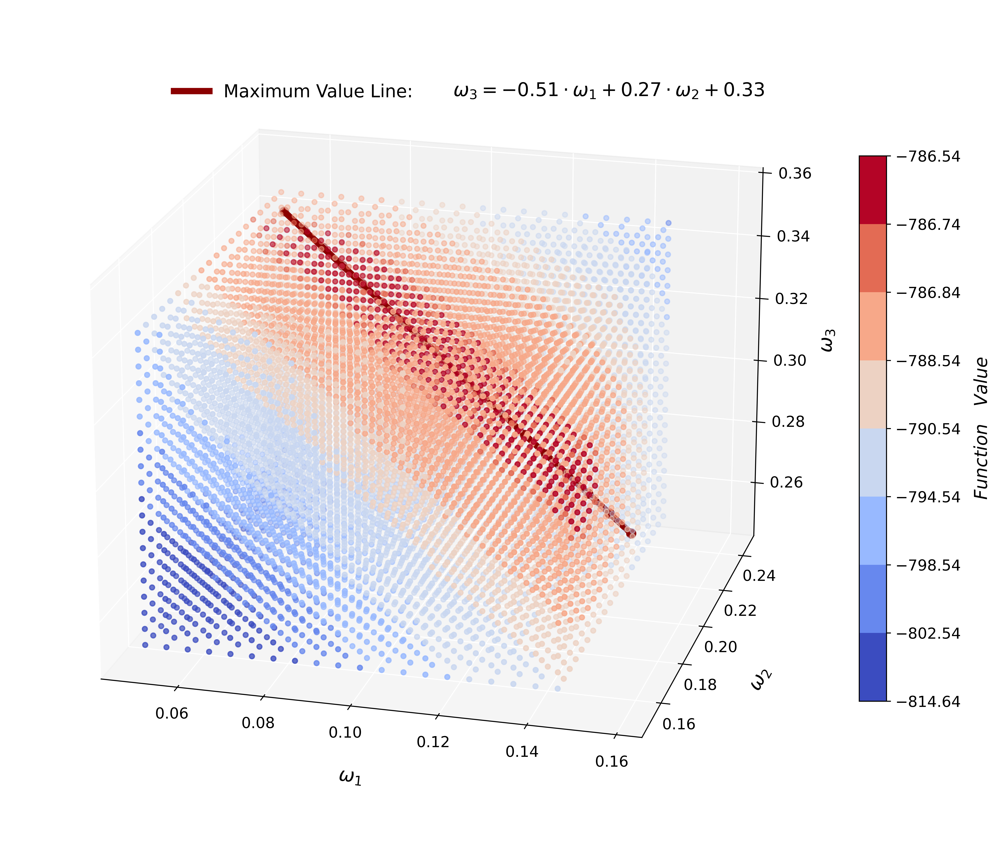

In [12]:
# Create truncated colormap
cmap = plt.cm.coolwarm
bounds = np.array([np.min(P_values), np.max(P_values) - 16, np.max(P_values) - 12, np.max(P_values) - 8, np.max(P_values) - 4, np.max(P_values) - 2, np.max(P_values) - 0.3, np.max(P_values) - 0.2, np.max(P_values)])
norm = BoundaryNorm(bounds, cmap.N)

# Create 3D scatter plot with color representing P(x, y, z)
fig = plt.figure(figsize=(15, 12), dpi = 600)
ax = fig.add_subplot(111, projection="3d")
scatter = ax.scatter(X, Y, Z, c=P_values, cmap=cmap, norm=norm, s=15)
cbar = fig.colorbar(scatter, ax=ax, shrink=0.65, aspect=20, pad=0.01)
cbar.set_label("$Function \\quad Value$", fontsize=14, labelpad=10)
cbar.ax.tick_params(labelsize=12)

ax.view_init(elev=20, azim=-75)

# Fit linear equation
X1 = np.array(list(zip(ans_all_x, ans_all_y)))
y1 = np.array(ans_all_z)
model = LinearRegression()
model.fit(X1, y1)
coefficients = model.coef_
intercept = model.intercept_

# Add ans_all data points and connect with line
ax.scatter(ans_all_x[:-12], ans_all_y[:-12], ans_all_z[:-12], color='darkred', s=50)
ax.plot(ans_all_x[:-12], ans_all_y[:-12], ans_all_z[:-12], color='darkred', linewidth=5, label='Maximum Value Line:')

# Set labels and title
ax.set_xlabel("$\\omega_1$", fontsize = 15, labelpad=18)
ax.set_ylabel("$\\omega_2$", fontsize = 15, labelpad=18)
ax.set_zlabel("$\\omega_3$", fontsize = 15, labelpad=18)
#plt.title("Four Dimensional Probability Distribution")

# Set axis line width
ax.xaxis.set_tick_params(width=2)
ax.yaxis.set_tick_params(width=2)
ax.zaxis.set_tick_params(width=2, pad=10)

# Set tick line and tick label width
ax.tick_params(axis='x', which='both', width=2, labelsize=12)
ax.tick_params(axis='y', which='both', width=2, labelsize=12)
ax.tick_params(axis='z', which='both', width=2, labelsize=12)

ax.xaxis._axinfo['grid'].update(color='white')
ax.yaxis._axinfo['grid'].update(color='white')
ax.zaxis._axinfo['grid'].update(color='white')

# Add fitted linear equation to bottom of plot
equation_text = f"$\\omega_3 = {coefficients[0]:.2f} \\cdot \\omega_1 + {coefficients[1]:.2f} \\cdot \\omega_2 + {intercept:.2f}$"
plt.figtext(0.6, 0.8, equation_text, ha="center", fontsize=15, color='black')

# Show legend without frame
ax.legend(frameon=False, fontsize=14, loc='upper right', bbox_to_anchor=(0.5, 0.93))

# Show the plot
plt.show()